In [1]:
%load_ext autoreload
%autoreload 2

import os

import h5py
import numpy as np

from matplotlib import pyplot as plt
from matplotlib.colors import Normalize

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

import sys
sys.path.insert(1, '../')

from utils.viz import *
from utils.spectra_metrics import fl_weights

os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'

inf_dir = '/pscratch/sd/j/jpduncan/tsitprecip/baseline/precip_spectra'

control_file = 'control/ens_autoregressive_predictions_spectra_control_tp.h5'
ens100_file = 'ens100/ens_autoregressive_predictions_spectra_0.1_100ens_tp.h5'

anom_control_file = 'anomaly_control/ens_autoregressive_predictions_spectra_anomaly_control_tp.h5'

control = h5py.File(os.path.join(inf_dir, control_file), 'r')
ens100 = h5py.File(os.path.join(inf_dir, ens100_file), 'r')

anom_control = h5py.File(os.path.join(inf_dir, anom_control_file), 'r')

DECORRELATION_TIME = 8

print(control.keys(), '\n')
print(f'num. initial conditions: {control["corr_amp_by_freq"].shape[0]}\n')
print(f'farthest prediction horizon: {control["corr_amp_by_freq"].shape[1]} steps = {control["corr_amp_by_freq"].shape[1] * 6} hrs\n')
print(f'num. freqencies / wave numbers: {control["corr_amp_by_freq"].shape[3]}')

<KeysViewHDF5 ['acc', 'corr_amp', 'corr_amp_by_freq', 'corr_phase', 'corr_phase_by_freq', 'err_amp_by_freq', 'fcl', 'fcl_by_freq', 'ffl', 'ffl_by_freq', 'pred_amp_by_freq', 'rmse', 'rmse_amp', 'rmse_amp_by_freq', 'rmse_phase', 'rmse_phase_by_freq', 'tar_amp_by_freq', 'tqe', 'wf_corr_amp', 'wf_corr_amp_by_freq', 'wf_corr_phase', 'wf_corr_phase_by_freq', 'wf_fcl', 'wf_fcl_by_freq', 'wf_ffl', 'wf_ffl_by_freq', 'wf_rmse_amp', 'wf_rmse_amp_by_freq', 'wf_rmse_phase', 'wf_rmse_phase_by_freq', 'wfl_corr_amp', 'wfl_corr_amp_by_freq', 'wfl_corr_phase', 'wfl_corr_phase_by_freq', 'wfl_fcl', 'wfl_fcl_by_freq', 'wfl_ffl', 'wfl_ffl_by_freq', 'wfl_rmse_amp', 'wfl_rmse_amp_by_freq', 'wfl_rmse_phase', 'wfl_rmse_phase_by_freq', 'wl_corr_amp', 'wl_corr_amp_by_freq', 'wl_corr_phase', 'wl_corr_phase_by_freq', 'wl_fcl', 'wl_fcl_by_freq', 'wl_ffl', 'wl_ffl_by_freq', 'wl_rmse_amp', 'wl_rmse_amp_by_freq', 'wl_rmse_phase', 'wl_rmse_phase_by_freq']> 

num. initial conditions: 178

farthest prediction horizon: 41 

In [2]:
control['acc']

<HDF5 dataset "acc": shape (178, 41, 1), type "<f4">

## **Power spectra** x **time** x **wave number**

Average across 178 initial conditions.

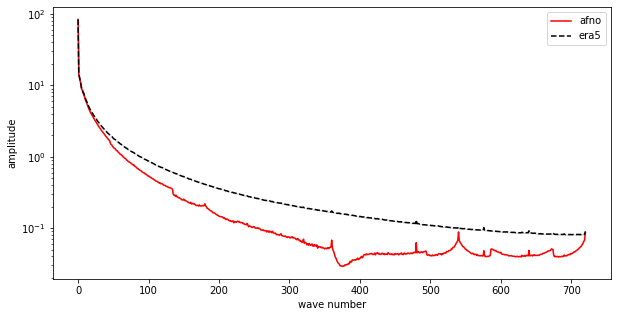

In [3]:
wavenum = np.arange(start=0, stop=control['pred_amp_by_freq'].shape[-1])

ic_mean = True
ic_idx = np.random.randint(control['pred_amp_by_freq'].shape[0]) # used when ic_mean is False

plt_params = {
    'afno': ['pred_amp_by_freq', 'r-'], 
    'era5': ['tar_amp_by_freq', 'k--'],
}

plt.figure(figsize=(10, 5))

for label, (key, lstyle) in plt_params.items():
    if ic_mean:
        mean = np.mean(control[key][:, 1, 0, :], axis=0)
        stderr = np.std(control[key][:, 1, 0, :], axis=0) / np.sqrt(control[key][:, 1, 0, :].shape[0])
        plt.semilogy(wavenum, mean, lstyle, label=label)
        plt.fill_between(wavenum, mean - stderr, mean + stderr,
                         color=lstyle[0], alpha=0.1)
        
    else:
        plt.semilogy(wavenum, control[key][ic_idx, 1, 0, :], 
                     lstyle, label=label)
        

plt.xlabel('wave number')
plt.ylabel('amplitude')
plt.legend()
plt.show()

/tmp/ipykernel_226346/2116343521.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


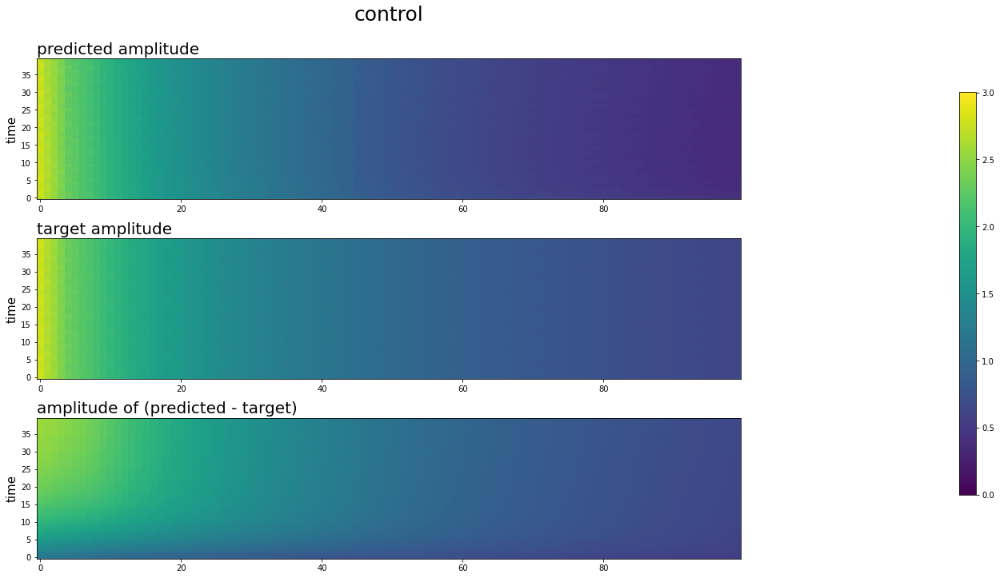

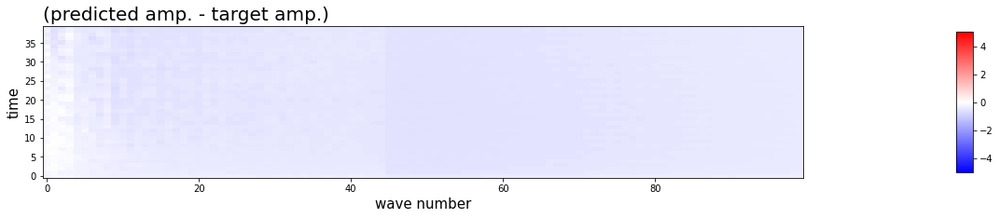

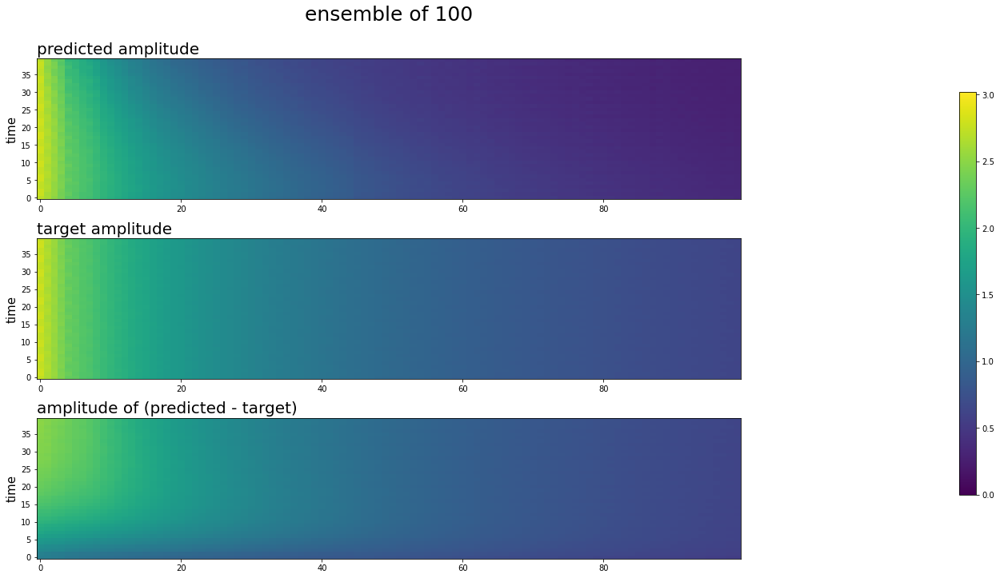

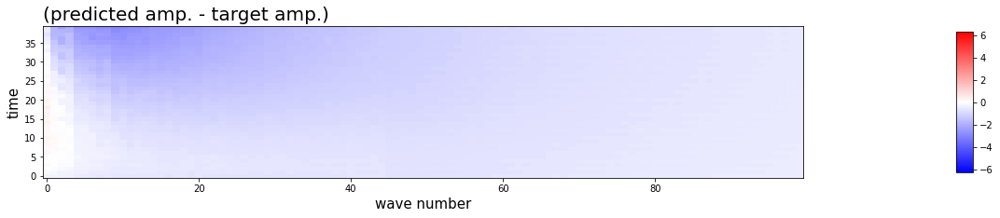

In [4]:
for title, run in [('control', control), ('ensemble of 100', ens100)]:
    
    sc = (0, # np.min(run['pred_amp_by_freq'][:, 1:, 0, 1:]), 
          np.max(np.log1p(run['pred_amp_by_freq'][:, 1:, 0, 1:101])))

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 10))
    
    im = axes[0].imshow(np.log1p(np.mean(run['pred_amp_by_freq'][:, 1:, 0, 1:101], axis=0)), aspect=0.5, norm=Normalize(sc[0], sc[1]))
    axes[0].invert_yaxis()
    axes[0].set_ylabel('time', size=15)
    axes[0].tick_params(axis='both', labelsize=10)
    axes[0].set_title('predicted amplitude', size=20, loc='left')
    
    im = axes[1].imshow(np.log1p(np.mean(run['tar_amp_by_freq'][:, 1:, 0, 1:101], axis=0)), aspect=0.5, norm=Normalize(sc[0], sc[1]))
    axes[1].invert_yaxis()
    axes[1].set_ylabel('time', size=15)
    axes[1].tick_params(axis='both', labelsize=10)
    axes[1].set_title('target amplitude', fontsize=20, loc='left')
    
    im = axes[2].imshow(np.log1p(np.mean(run['err_amp_by_freq'][:, 1:, 0, 1:101], axis=0)), aspect=0.5, norm=Normalize(sc[0], sc[1]))
    axes[2].invert_yaxis()
    axes[2].set_ylabel('time', size=15)
    axes[2].tick_params(axis='both', labelsize=10)
    axes[2].set_title('amplitude of (predicted - target)', fontsize=20, loc='left')

    plt.suptitle(title, fontsize=25, x=0.5, y=1)
    
    cbar_ax = fig.add_axes([0.83, 0.15, 0.01, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    plt.tight_layout()
    plt.show()
    
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(25, 3))
    
    sc = np.max(np.abs(run['pred_amp_by_freq'][:, 1:, 0, 1:101] - run['tar_amp_by_freq'][:, 1:, 0, 1:101]))
    
    im = axes.imshow(np.mean(run['pred_amp_by_freq'][:, 1:, 0, 1:101] - run['tar_amp_by_freq'][:, 1:, 0, 1:101], axis=0), 
                        aspect=0.5, norm=Normalize(-sc, sc), cmap=plt.get_cmap('bwr'))
    axes.invert_yaxis()
    axes.set_ylabel('time', size=15)
    axes.set_xlabel('wave number', size=15)
    axes.tick_params(axis='both', labelsize=10)
    axes.set_title('(predicted amp. - target amp.)', fontsize=20, loc='left')
    
    cbar_ax = fig.add_axes([0.83, 0.15, 0.01, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    plt.show()

## **Unweighted spectra metrics**

- Precip metrics: ACC, RMSE, TQE
- Amplitude / phase metrics: RMSE & correlation of _(target, prediction)_ for amplitude & phase.
- Spectral loss metrics:
    - Fourier coefficient loss (FCL)
    - Focal frequency loss (FFL)
    - RMSE spec.: Sum of amp. / phase RMSE
    - Corr. spec.: Product of amp. / phase correlation

### Metric vs. time | control vs. ensemble of 100

Average over all initial conditions.

In [5]:
control['acc'].shape

(178, 41, 1)

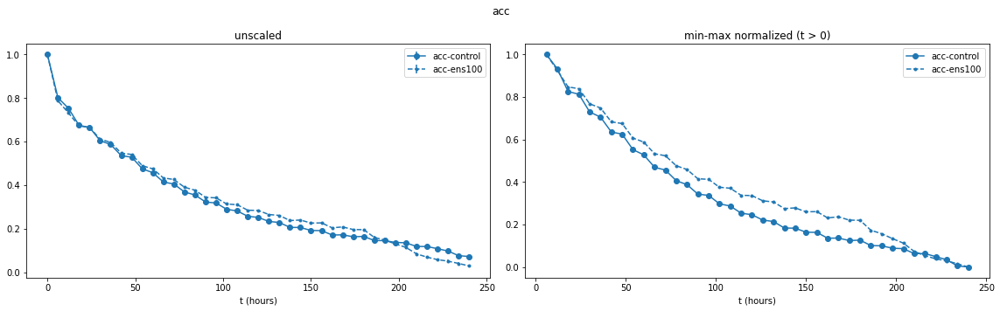

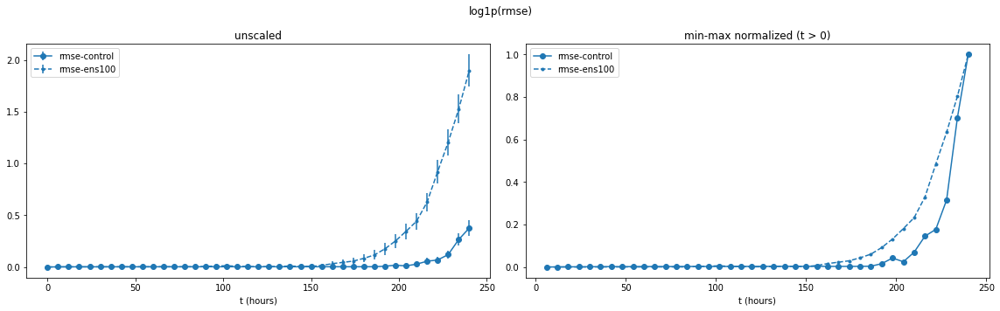

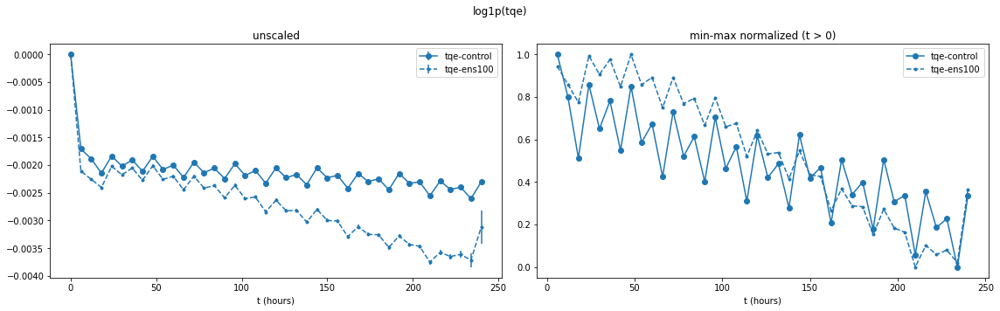

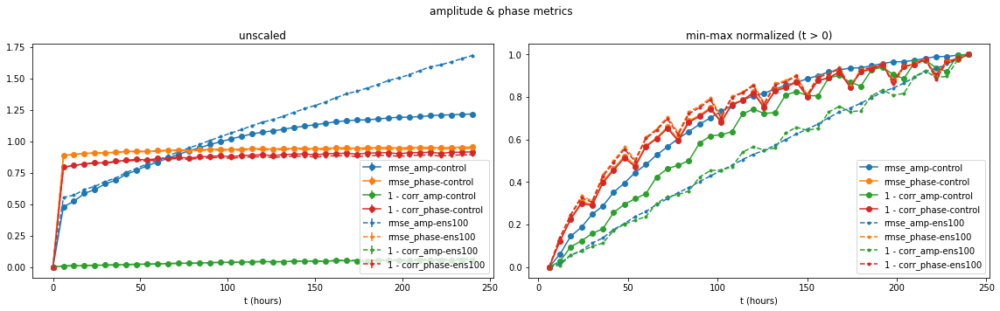

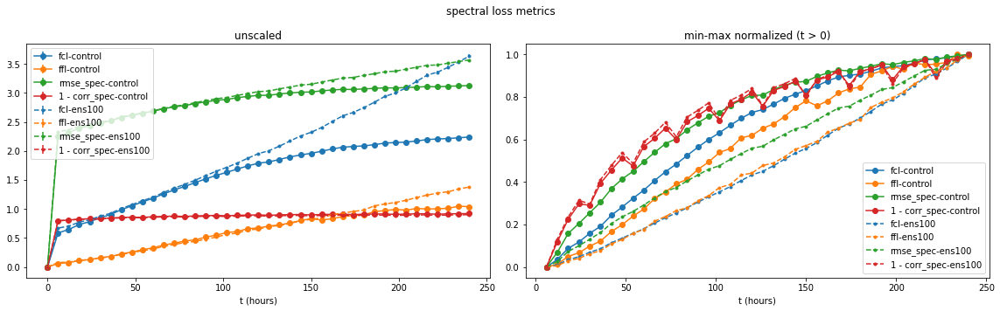

In [6]:
grouped_metrics = {}

runs = [('control', control), ('ens100', ens100)]

for (run_name, h5f) in runs:
    
    grouped_metrics.setdefault('acc', {})[run_name] = { 
        'acc': h5f['acc'],
    }
    
    grouped_metrics.setdefault('log1p(rmse)', {})[run_name] = { 
        'rmse': np.log1p(h5f['rmse']),
    }
    
    grouped_metrics.setdefault('log1p(tqe)', {})[run_name] = { 
        'tqe': h5f['tqe'],
    }
    
    grouped_metrics.setdefault('amplitude & phase metrics', {})[run_name] = {
        'rmse_amp': h5f['rmse_amp'],
        'rmse_phase': h5f['rmse_phase'],
        '1 - corr_amp': 1 - np.array(h5f['corr_amp']),
        '1 - corr_phase': 1 - np.array(h5f['corr_phase']),
    }
    grouped_metrics.setdefault('spectral loss metrics', {})[run_name] = {
        'fcl': np.array(h5f['fcl']) - 1.,
        'ffl': h5f['ffl'],
        'rmse_spec': np.array(h5f['rmse_amp']) + 2*np.array(h5f['rmse_phase']),
        '1 - corr_spec': 1. - np.array(h5f['corr_amp'])*np.array(h5f['corr_phase']),
    }

run_style = {
    'control': ('o', '-'),
    'ens100': ('.', '--'),
}

for title, runs_dict in grouped_metrics.items():
    
    plt.figure(figsize=(16, 5))
    
    for run_name, metric_dict in runs_dict.items():

        for i, (label, metric_arr) in enumerate(metric_dict.items()):

            t = np.arange(metric_arr.shape[1]) * 6
            n_ics = metric_arr.shape[0]

            seq_mean = np.mean(metric_arr, axis=0).squeeze()
            seq_se = np.std(metric_arr, axis=0).squeeze() / np.sqrt(n_ics)

            marker, linestyle = run_style[run_name]
            
            label = f'{label}-{run_name}'
            
            plt.subplot(1, 2, 1)
            plt.errorbar(t, seq_mean, seq_se, color=colors[i], marker=marker, linestyle=linestyle, label=label)
            plt.xlabel('t (hours)')
            plt.title('unscaled')
            plt.legend()
            
            # leave off the first timepoint which is same as ground truth
            seq_mean = seq_mean[1:]
            # seq_mean = seq_mean / np.max(seq_mean)
            seq_mean = 1 - (seq_mean.max() - seq_mean) / (seq_mean.max() - seq_mean.min())
            plt.subplot(1, 2, 2)
            plt.plot(t[1:], seq_mean, color=colors[i], marker=marker, linestyle=linestyle, label=label)
            plt.xlabel('t (hours)')
            plt.title('min-max normalized (t > 0)')
            # plt.title('max scaled (t > 0)')
            plt.legend()

    plt.suptitle(f'{title}')
    plt.tight_layout()
    plt.show()

### Spectra **metrics** x **time** x **wave number**

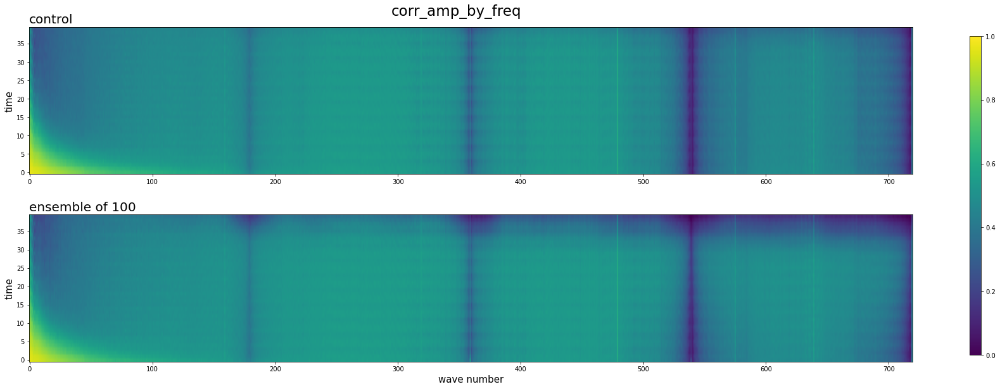

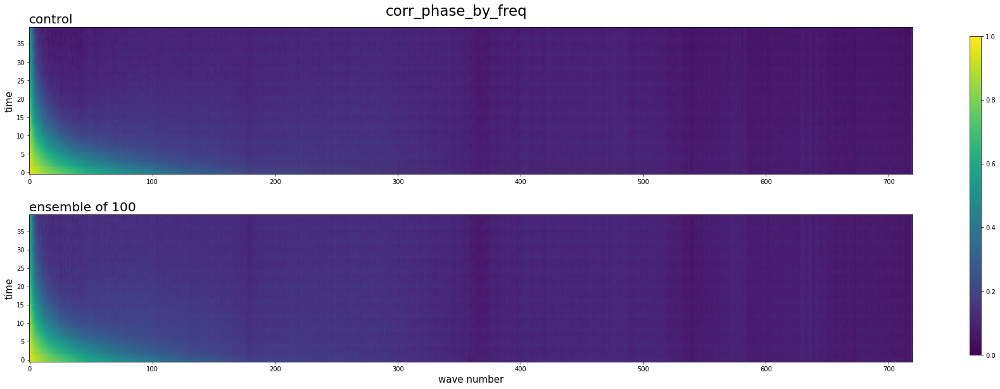

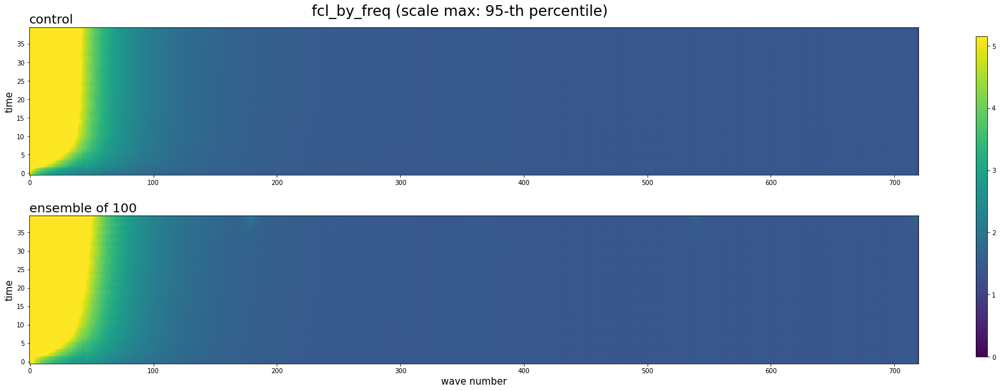

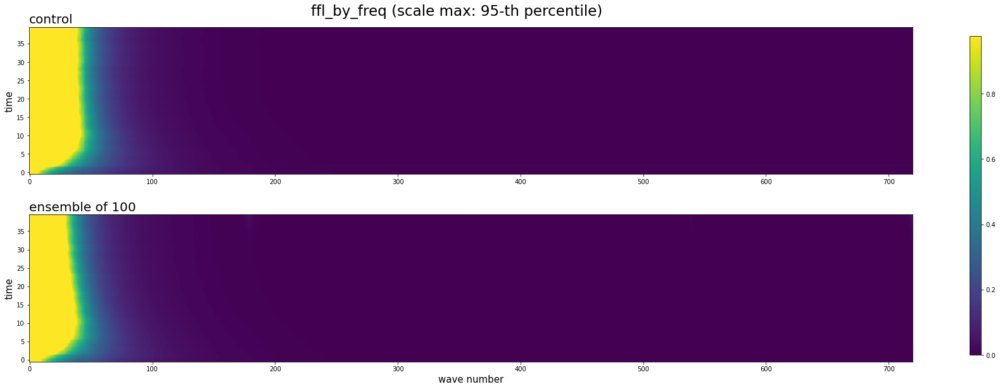

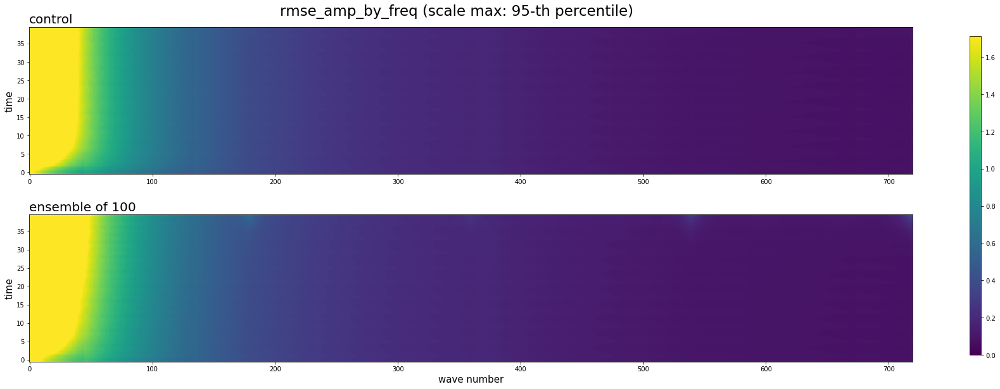

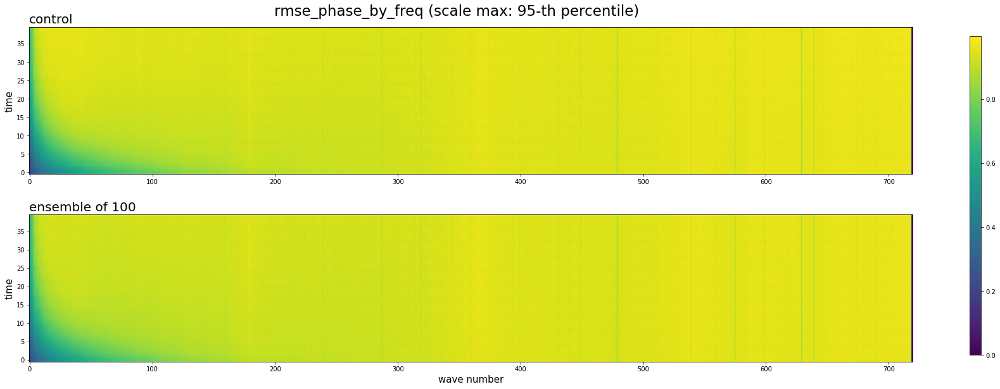

In [7]:
# (n_ics, n_t, n_c, n_freq)
# print(control['corr_phase_by_freq'].shape)

max_rmse = 8

for name in [k for k in control.keys() 
             if '_by_freq' in k 
             and not 'wf_' in k
             and not 'wl_' in k
             and not 'wfl_' in k
             and not k in ['tar_amp_by_freq', 
                           'pred_amp_by_freq',
                           'err_amp_by_freq']]:
    
    if 'acc' in name or 'corr' in name:
        sc = (0, 1)
    # elif 'rmse' in name:
    #     sc = (0, max_rmse)
    elif 'fcl' in name or 'ffl' in name or 'rmse' in name:
        sc = (0, np.quantile(control[name], .95))
    else:
        sc = (np.min(control[name][:, 1:, 0, 1:]), np.max(control[name][:, 1:, 0, 1:]))

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(25, 10))
    
    im = axes[0].imshow(np.mean(control[name][:, 1:, 0, 1:], axis=0), aspect=3, norm=Normalize(sc[0], sc[1]))
    axes[0].invert_yaxis()
    axes[0].set_ylabel('time', size=15)
    axes[0].tick_params(axis='both', labelsize=10)
    axes[0].set_title('control', size=20, loc='left')
    
    if name in ens100.keys():
        im = axes[1].imshow(np.mean(ens100[name][:, 1:, 0, 1:], axis=0), aspect=3, norm=Normalize(sc[0], sc[1]))
        axes[1].invert_yaxis()
        axes[1].set_ylabel('time', size=15)
        axes[1].set_xlabel('wave number', size=15)
        axes[1].tick_params(axis='both', labelsize=10)
        axes[1].set_title('ensemble of 100', fontsize=20, loc='left')

    if 'fcl' in name or 'ffl' in name or 'rmse' in name:
        name = name + ' (scale max: 95-th percentile)'
        
    plt.suptitle(name, fontsize=23, x=0.5, y=0.92)
    
    cbar_ax = fig.add_axes([0.95, 0.15, 0.01, 0.7])
    fig.colorbar(im, cax=cbar_ax)
    
    # plt.tight_layout()
    plt.show()

### Last 50 wave numbers 

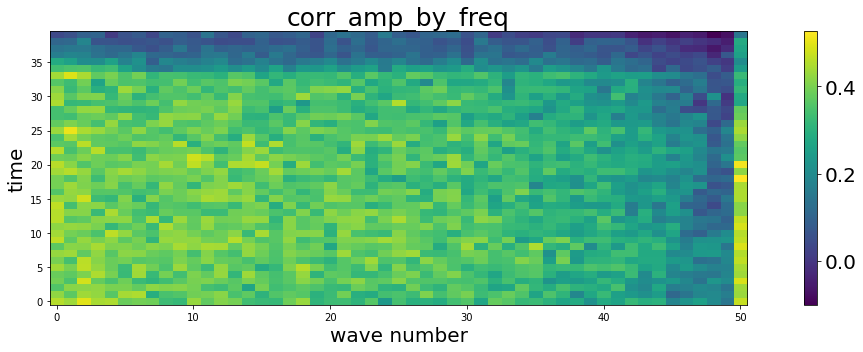

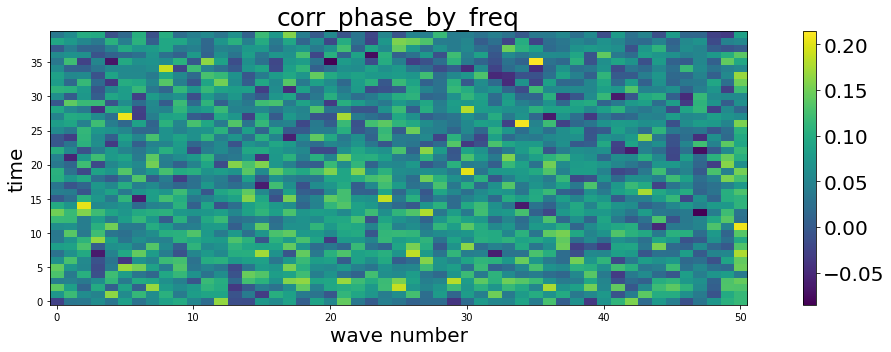

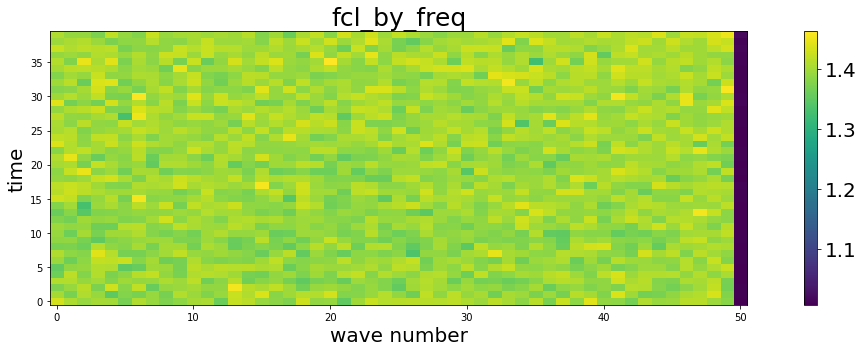

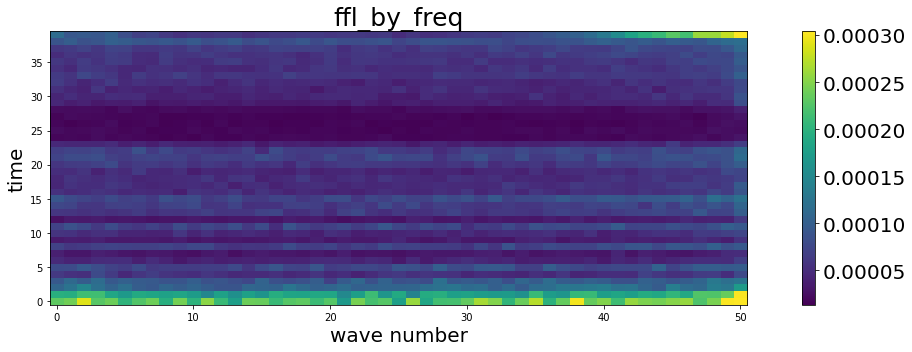

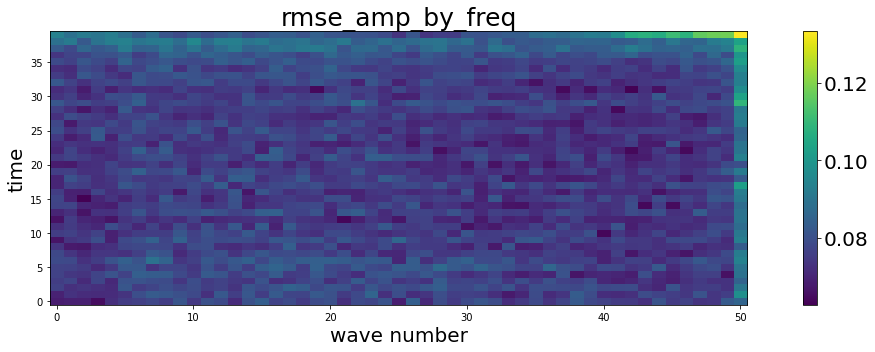

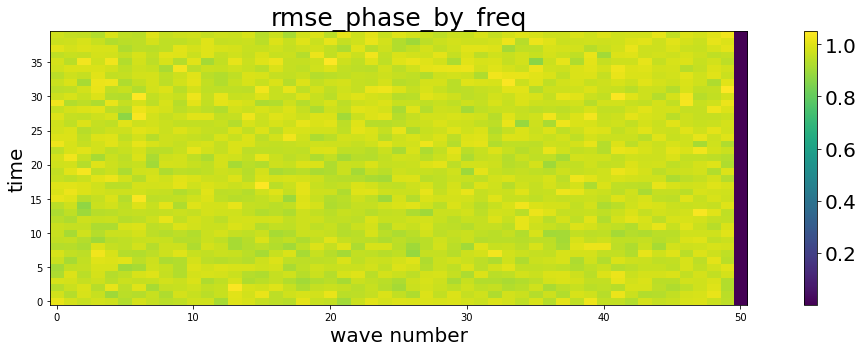

In [8]:
# (n_ics, n_t, n_c, n_freq)
# print(control['corr_phase_by_freq'].shape)

n_t = control['corr_phase_by_freq'].shape[1]
n_w = control['corr_phase_by_freq'].shape[3]

for name in [k for k in anom_control.keys() 
             if '_by_freq' in k 
             and not 'wf_' in k
             and not 'wl_' in k
             and not 'wfl_' in k
             and not k in ['tar_amp_by_freq', 
                           'pred_amp_by_freq',
                           'err_amp_by_freq']]:
    
    if 'acc' in name:
        sc = (0, 1)
    else:
        sc = (np.min(control[name][0, 1:, 0, 670:721]), np.max(control[name][0, 1:, 0, 670:721]))
        

    plt.figure(figsize=(20, 5))
    # plt.gca().set_aspect('equal')
    plt.imshow(control[name][0, 1:, 0, 670:721], aspect=0.5, norm=Normalize(sc[0], sc[1]))
    plt.gca().invert_yaxis()
    plt.xlabel('wave number', fontsize=20)
    plt.ylabel('time', fontsize=20)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    cbar = plt.colorbar(location='right',fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=20) 
    plt.title(name, fontsize=25)
    plt.tight_layout()
    plt.show()

## **Frequency- & latituded-weighted metrics**

### Weights for different combinations of freq. / latitude weighting

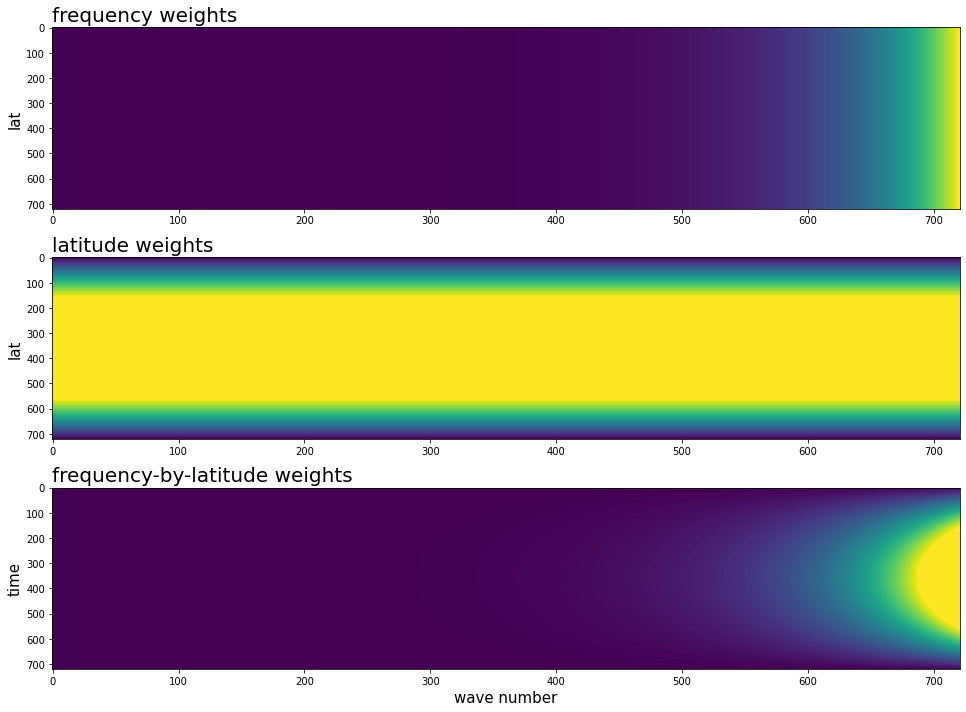

In [9]:
num_freq = control["corr_amp_by_freq"].shape[3]
num_lat = 720

fw = fl_weights(num_freq, num_lat, freq_weighting = True, lat_weighting = False).squeeze()
lw = fl_weights(num_freq, num_lat, freq_weighting = False, lat_weighting = True).squeeze()
flw = fl_weights(num_freq, num_lat, freq_weighting = True, lat_weighting = True).squeeze()

sc = (0, 1)

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(30, 10))

im = axes[0].imshow(fw, aspect=0.2, norm=Normalize(sc[0], sc[1]))
axes[0].set_ylabel('lat', size=15)
axes[0].tick_params(axis='both', labelsize=10)
axes[0].set_title('frequency weights', size=20, loc='left')

im = axes[1].imshow(lw, aspect=0.2, norm=Normalize(sc[0], sc[1]))
axes[1].set_ylabel('lat', size=15)
axes[1].tick_params(axis='both', labelsize=10)
axes[1].set_title('latitude weights', size=20, loc='left')

im = axes[2].imshow(flw, aspect=0.2, norm=Normalize(sc[0], sc[1]))
axes[2].set_ylabel('time', size=15)
axes[2].tick_params(axis='both', labelsize=10)
axes[2].set_title('frequency-by-latitude weights', size=20, loc='left')
axes[2].set_xlabel('wave number', size=15)

plt.tight_layout()
plt.show()

### Weighted vs. unweighted spectra metrics

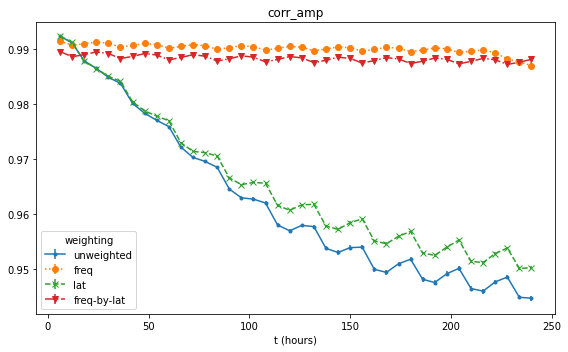

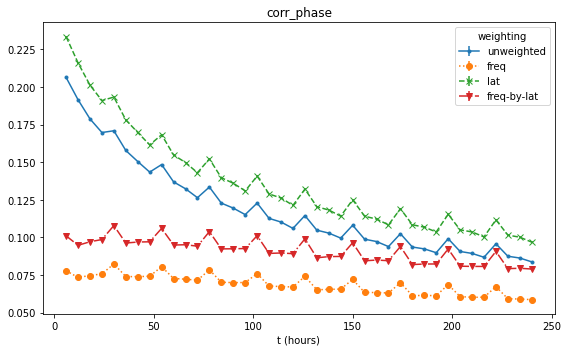

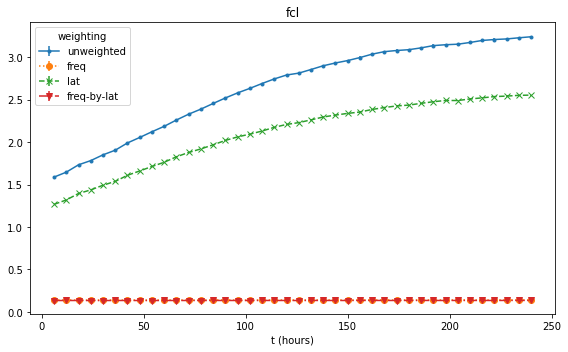

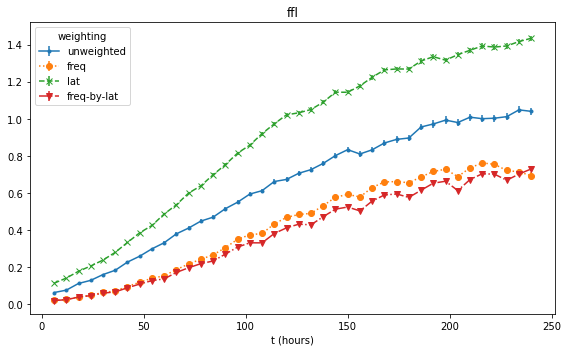

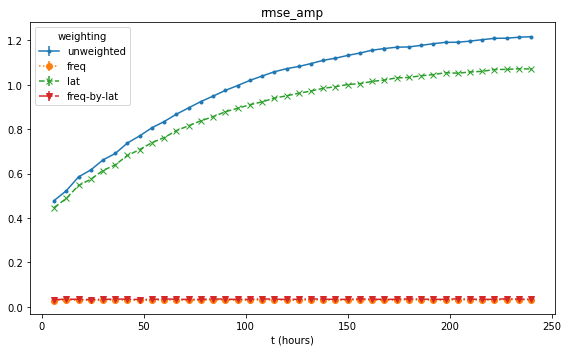

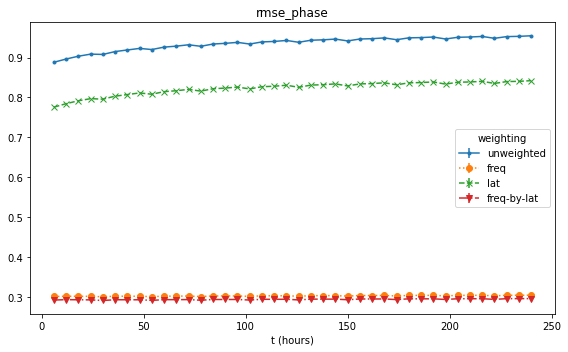

In [10]:
grouped_metrics = {}

spec_names = [k for k in control.keys() if '_by_freq' not in k and 'w' not in k and
              ('amp' in k or 'phase' in k or 'ffl' in k or 'fcl' in k)]

for name in spec_names:
    
    wf_name = 'wf_' + name
    wl_name = 'wl_' + name
    wfl_name = 'wfl_' + name
    
    e100_name = name + '_ens100'
    wf_e100_name = wf_name + '_ens100'
    wl_e100_name = wl_name + '_ens100'
    wfl_e100_name = wfl_name + '_ens100'

    grouped_metrics[name] = { 
        name: control[name],
        wf_name: control[wf_name],
        wl_name: control[wl_name],
        wfl_name: control[wfl_name],
        # e100_name: ens100[name],
        # wf_e100_name: ens100[wf_name],
        # wl_e100_name: ens100[wl_name],
        # wfl_e100_name: ens100[wfl_name],
    }

name_style = {
    'freq': ('o', ':'),
    'lat': ('x', '--'),
    'freq-by-lat': ('v', '-.'),
    'unweighted': ('.', '-'),
}

for title, metric_dict in grouped_metrics.items():
    
    plt.figure(figsize=(8, 5))

    for label, metric_arr in metric_dict.items():

        t = np.arange(metric_arr.shape[1]) * 6
        n_ics = metric_arr.shape[0]

        seq_mean = np.mean(metric_arr, axis=0).squeeze()
        seq_se = np.std(metric_arr, axis=0).squeeze() / np.sqrt(n_ics)

        if 'wf_' in label:
            label = 'freq'
        elif 'wl_' in label:
            label = 'lat'
        elif 'wfl_' in label:
            label = 'freq-by-lat'
        else:
            label = 'unweighted'
            
        marker, linestyle = name_style[label]

        plt.errorbar(t[1:], seq_mean[1:], seq_se[1:], marker=marker, linestyle=linestyle, label=label)
        plt.xlabel('t (hours)')
        plt.title(title)
        plt.legend(title="weighting")

    # plt.suptitle(f'{title}')
    plt.tight_layout()
    plt.show()

### Weighted spectra **metrics** x **time** x **wave number**

#### Weighted by frequency and latitude

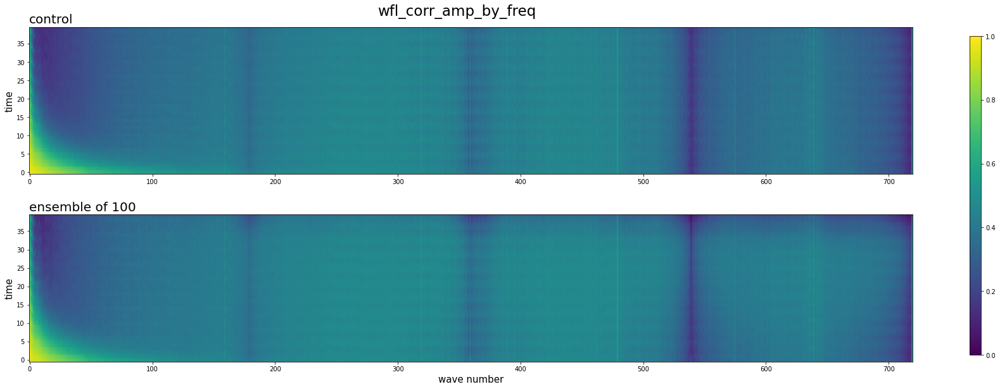

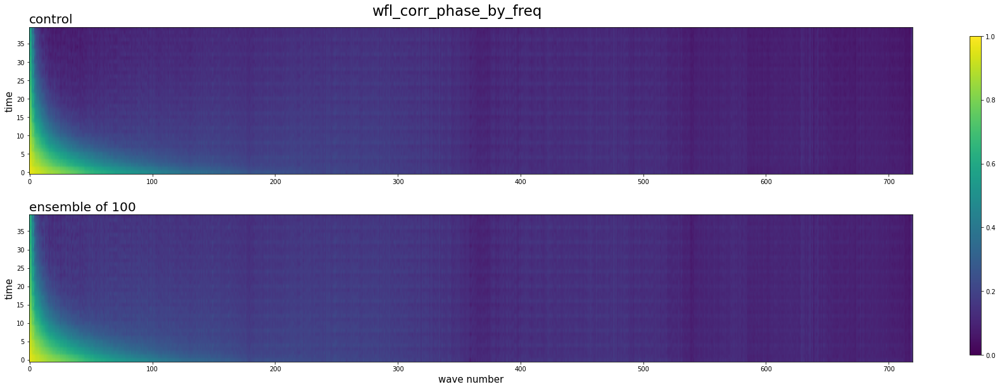

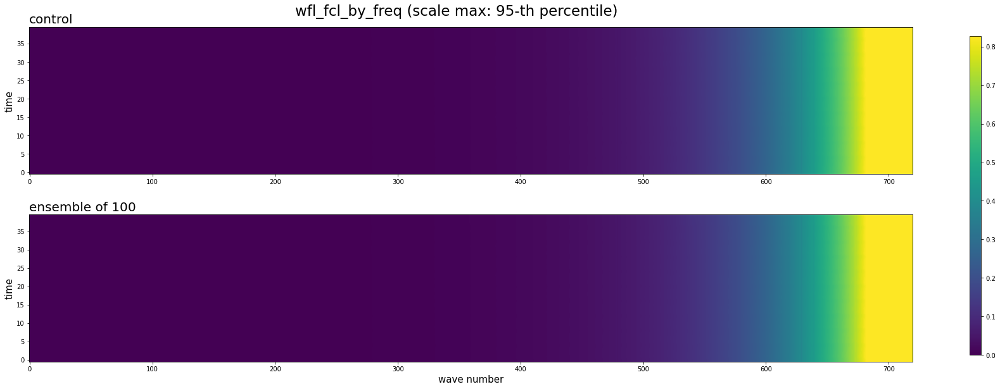

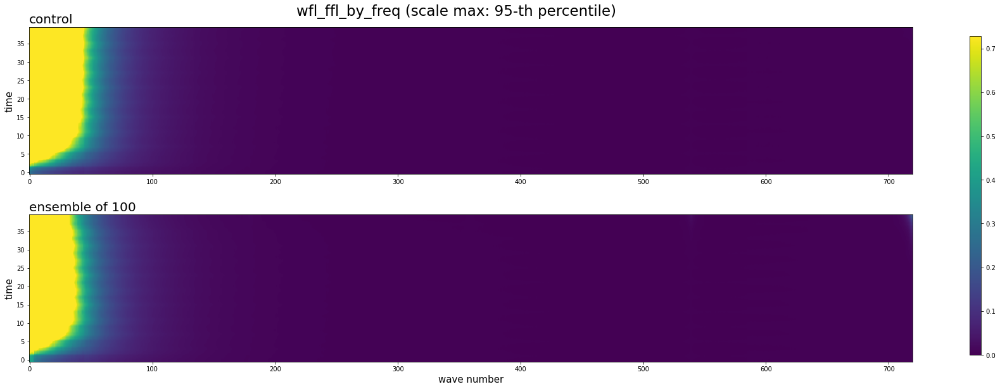

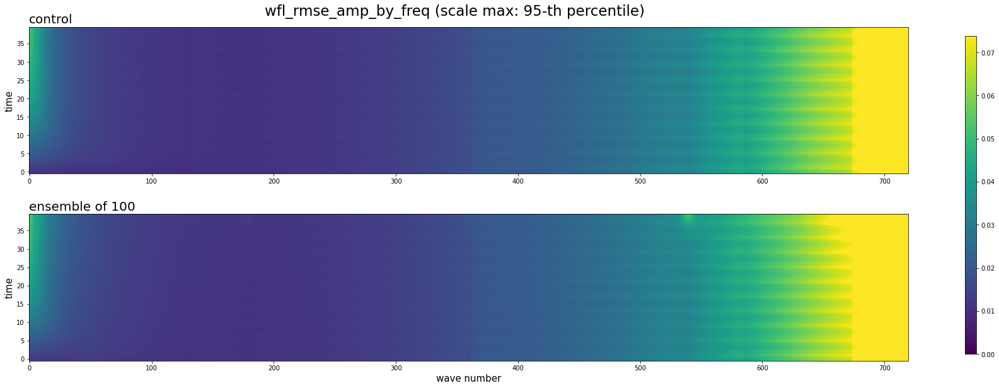

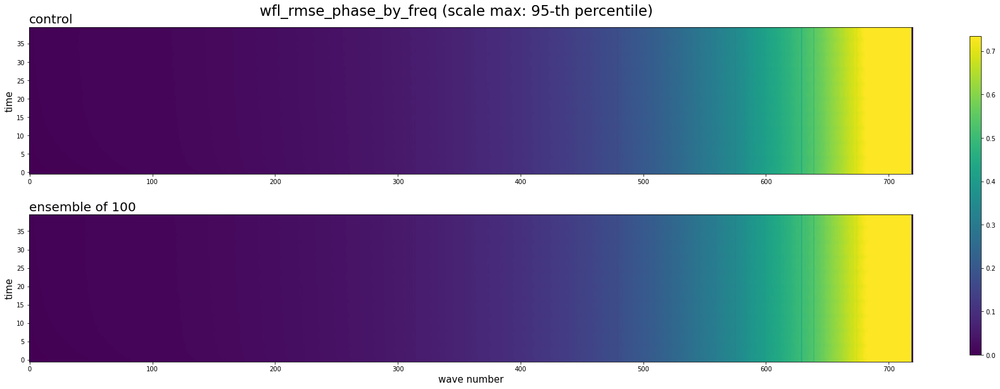

In [11]:
# (n_ics, n_t, n_c, n_freq)
# print(control['corr_phase_by_freq'].shape)

max_rmse = 8

for name in [k for k in control.keys() 
             if '_by_freq' in k and 'wfl_' in k]:
    
    if 'acc' in name or 'corr' in name:
        sc = (0, 1)
    # elif 'rmse' in name:
    #     sc = (0, max_rmse)
    elif 'fcl' in name or 'ffl' in name or 'rmse' in name:
        sc = (0, np.quantile(control[name], .95))
    else:
        sc = (np.min(control[name][:, 1:, 0, 1:]), np.max(control[name][:, 1:, 0, 1:]))

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(25, 10))
    
    im = axes[0].imshow(np.mean(control[name][:, 1:, 0, 1:], axis=0), aspect=3, norm=Normalize(sc[0], sc[1]))
    axes[0].invert_yaxis()
    axes[0].set_ylabel('time', size=15)
    axes[0].tick_params(axis='both', labelsize=10)
    axes[0].set_title('control', size=20, loc='left')
    
    if name in ens100.keys():
        im = axes[1].imshow(np.mean(ens100[name][:, 1:, 0, 1:], axis=0), aspect=3, norm=Normalize(sc[0], sc[1]))
        axes[1].invert_yaxis()
        axes[1].set_ylabel('time', size=15)
        axes[1].set_xlabel('wave number', size=15)
        axes[1].tick_params(axis='both', labelsize=10)
        axes[1].set_title('ensemble of 100', fontsize=20, loc='left')

    if 'fcl' in name or 'ffl' in name or 'rmse' in name:
        name = name + ' (scale max: 95-th percentile)'
        
    plt.suptitle(name, fontsize=23, x=0.5, y=0.92)
    
    cbar_ax = fig.add_axes([0.95, 0.15, 0.01, 0.7])
    fig.colorbar(im, cax=cbar_ax)
    
    # plt.tight_layout()
    plt.show()

#### Weighted by latitude

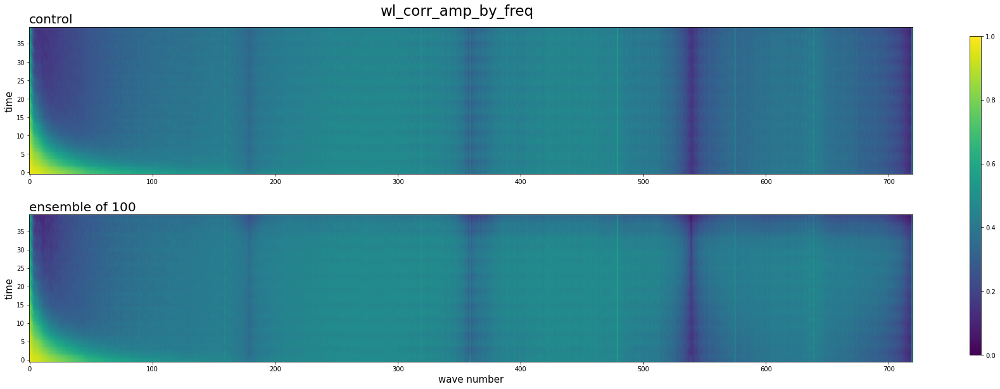

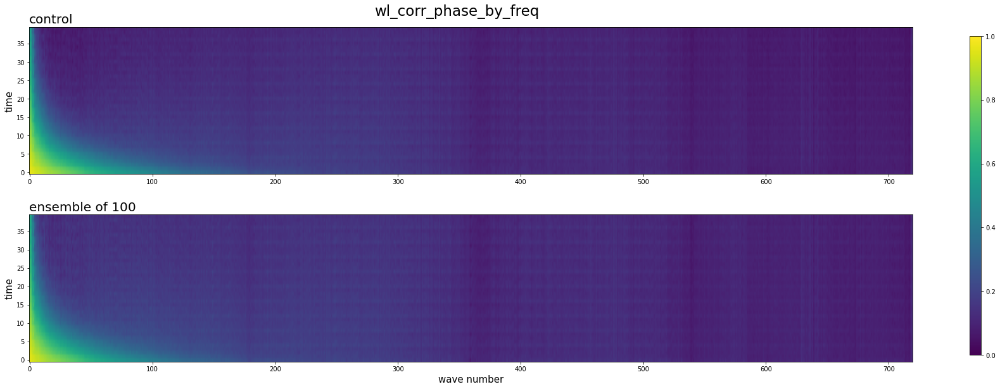

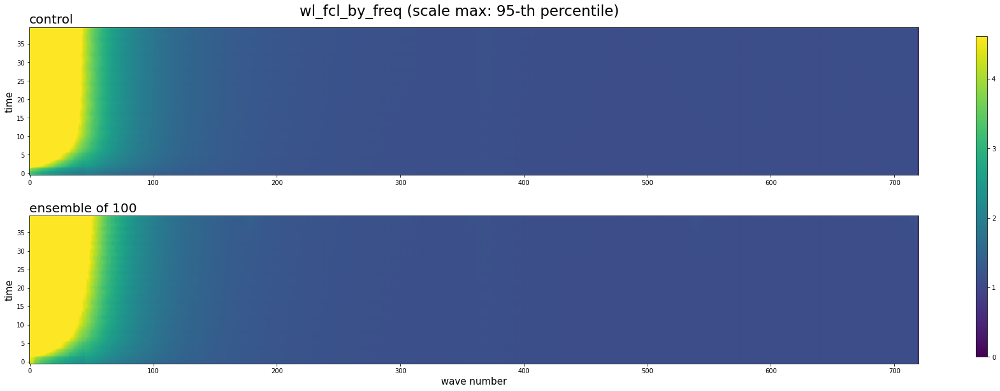

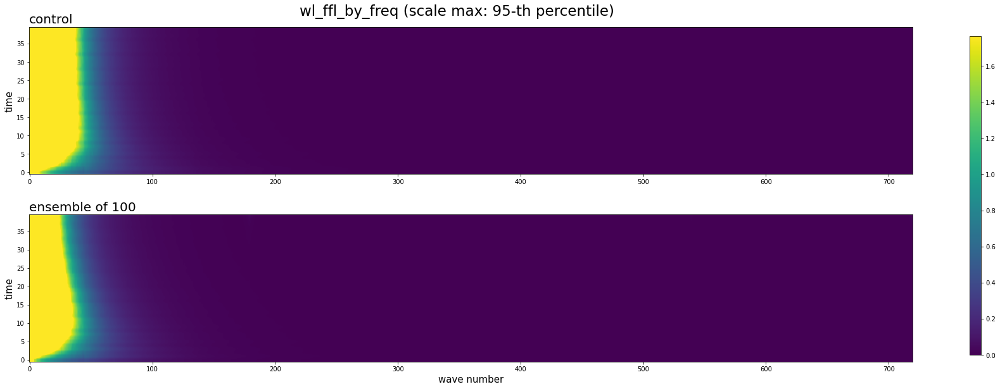

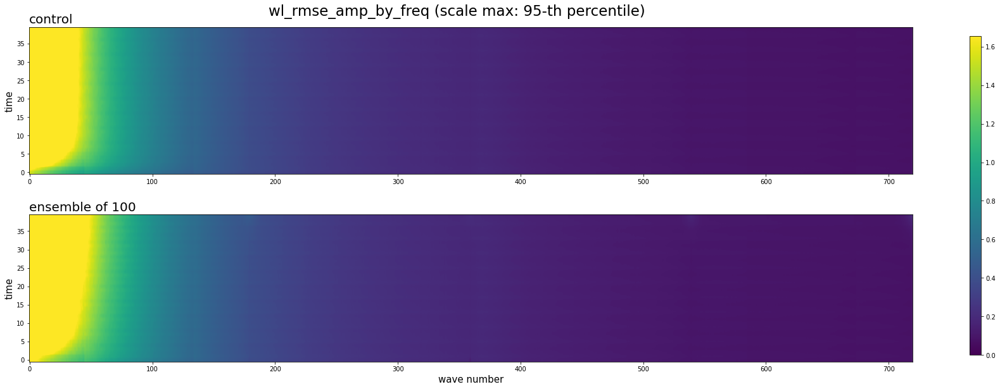

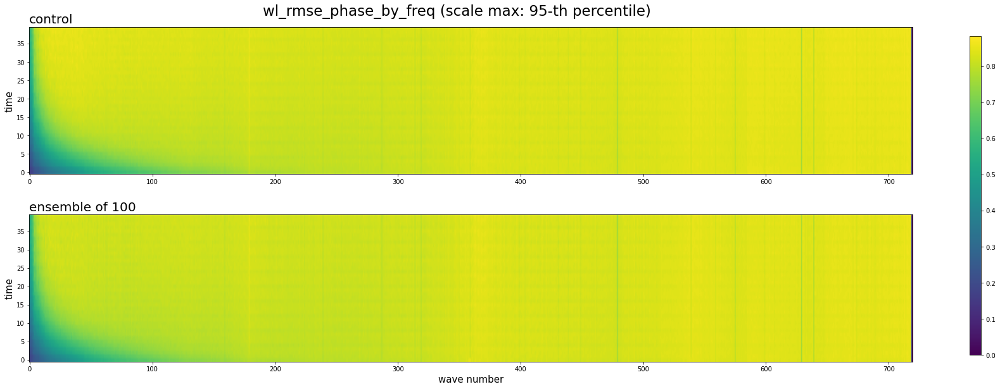

In [12]:
# (n_ics, n_t, n_c, n_freq)
# print(control['corr_phase_by_freq'].shape)

max_rmse = 8

for name in [k for k in control.keys() 
             if '_by_freq' in k and 'wl_' in k]:
    
    if 'acc' in name or 'corr' in name:
        sc = (0, 1)
    # elif 'rmse' in name:
    #     sc = (0, max_rmse)
    elif 'fcl' in name or 'ffl' in name or 'rmse' in name:
        sc = (0, np.quantile(control[name], .95))
    else:
        sc = (np.min(control[name][:, 1:, 0, 1:]), np.max(control[name][:, 1:, 0, 1:]))

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(25, 10))
    
    im = axes[0].imshow(np.mean(control[name][:, 1:, 0, 1:], axis=0), aspect=3, norm=Normalize(sc[0], sc[1]))
    axes[0].invert_yaxis()
    axes[0].set_ylabel('time', size=15)
    axes[0].tick_params(axis='both', labelsize=10)
    axes[0].set_title('control', size=20, loc='left')
    
    if name in ens100.keys():
        im = axes[1].imshow(np.mean(ens100[name][:, 1:, 0, 1:], axis=0), aspect=3, norm=Normalize(sc[0], sc[1]))
        axes[1].invert_yaxis()
        axes[1].set_ylabel('time', size=15)
        axes[1].set_xlabel('wave number', size=15)
        axes[1].tick_params(axis='both', labelsize=10)
        axes[1].set_title('ensemble of 100', fontsize=20, loc='left')

    if 'fcl' in name or 'ffl' in name or 'rmse' in name:
        name = name + ' (scale max: 95-th percentile)'
        
    plt.suptitle(name, fontsize=23, x=0.5, y=0.92)
    
    cbar_ax = fig.add_axes([0.95, 0.15, 0.01, 0.7])
    fig.colorbar(im, cax=cbar_ax)
    
    # plt.tight_layout()
    plt.show()

#### Weighted by frequency

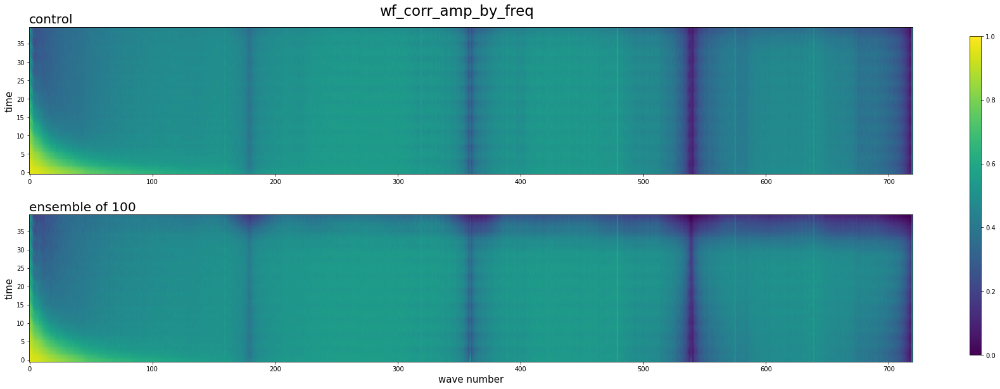

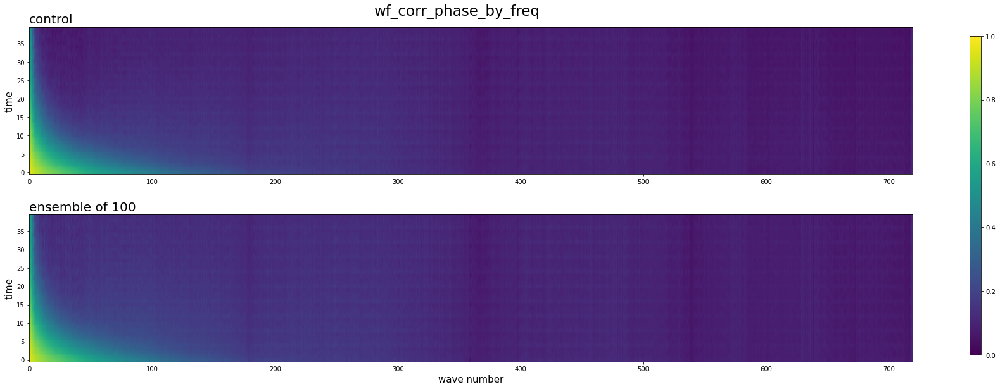

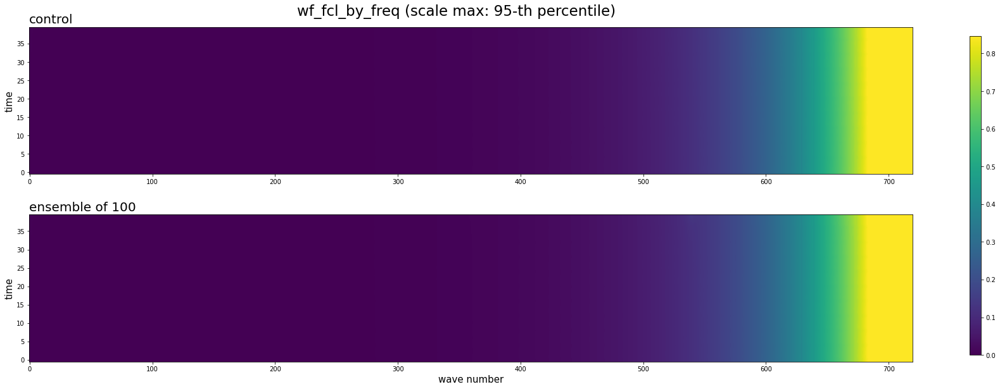

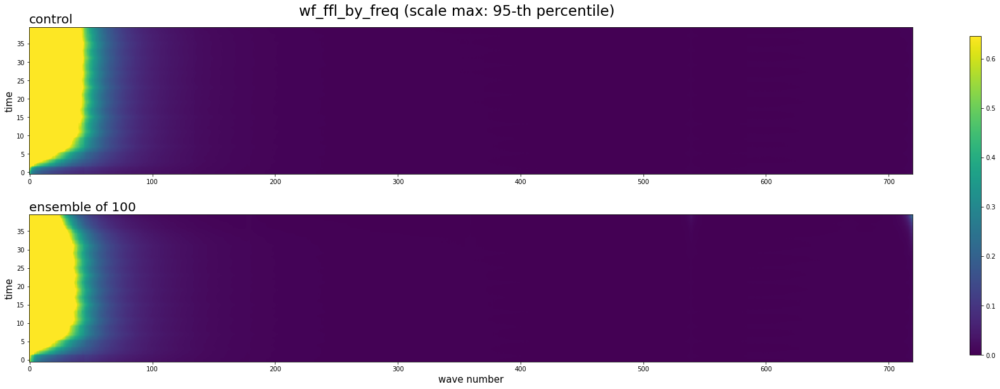

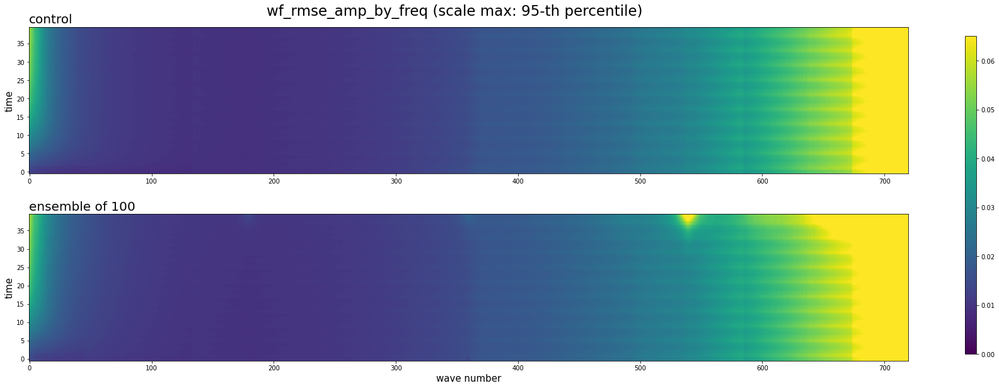

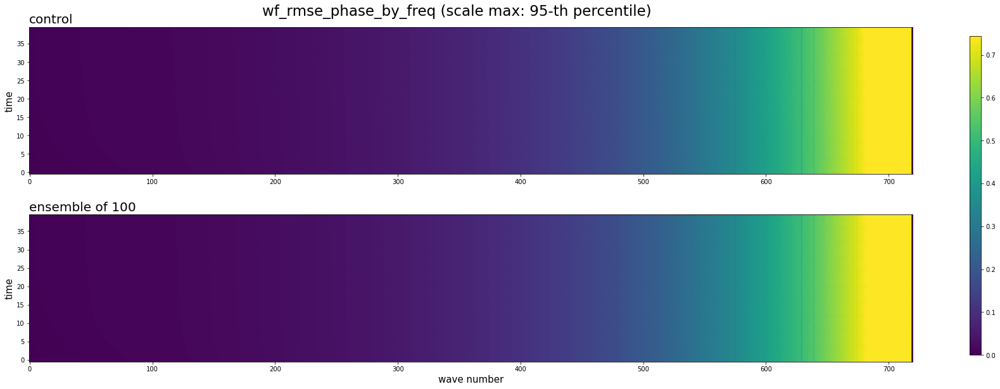

In [13]:
# (n_ics, n_t, n_c, n_freq)
# print(control['corr_phase_by_freq'].shape)

max_rmse = 8

for name in [k for k in control.keys() 
             if '_by_freq' in k and 'wf_' in k]:
    
    if 'acc' in name or 'corr' in name:
        sc = (0, 1)
    # elif 'rmse' in name:
    #     sc = (0, max_rmse)
    elif 'fcl' in name or 'ffl' in name or 'rmse' in name:
        sc = (0, np.quantile(control[name], .95))
    else:
        sc = (np.min(control[name][:, 1:, 0, 1:]), np.max(control[name][:, 1:, 0, 1:]))

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(25, 10))
    
    im = axes[0].imshow(np.mean(control[name][:, 1:, 0, 1:], axis=0), aspect=3, norm=Normalize(sc[0], sc[1]))
    axes[0].invert_yaxis()
    axes[0].set_ylabel('time', size=15)
    axes[0].tick_params(axis='both', labelsize=10)
    axes[0].set_title('control', size=20, loc='left')
    
    if name in ens100.keys():
        im = axes[1].imshow(np.mean(ens100[name][:, 1:, 0, 1:], axis=0), aspect=3, norm=Normalize(sc[0], sc[1]))
        axes[1].invert_yaxis()
        axes[1].set_ylabel('time', size=15)
        axes[1].set_xlabel('wave number', size=15)
        axes[1].tick_params(axis='both', labelsize=10)
        axes[1].set_title('ensemble of 100', fontsize=20, loc='left')

    if 'fcl' in name or 'ffl' in name or 'rmse' in name:
        name = name + ' (scale max: 95-th percentile)'
        
    plt.suptitle(name, fontsize=23, x=0.5, y=0.92)
    
    cbar_ax = fig.add_axes([0.95, 0.15, 0.01, 0.7])
    fig.colorbar(im, cax=cbar_ax)
    
    # plt.tight_layout()
    plt.show()

### Initial condition index vs. metric

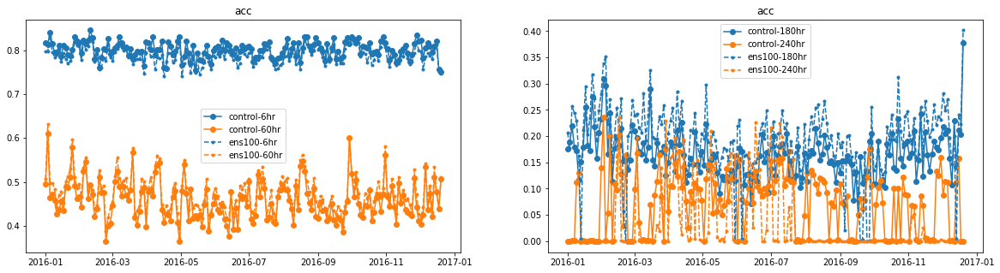

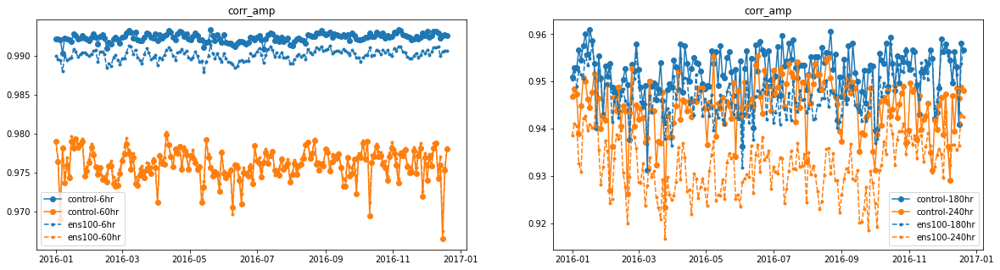

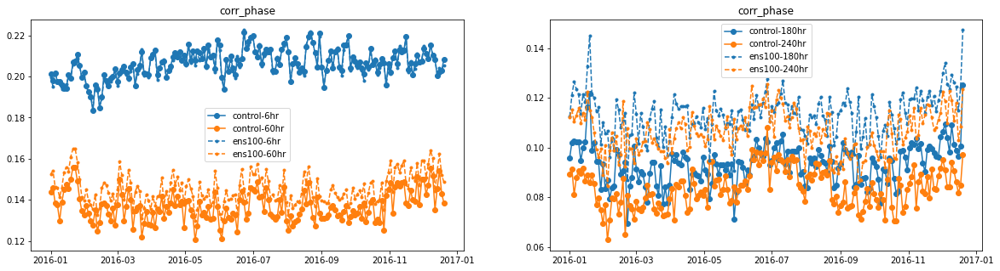

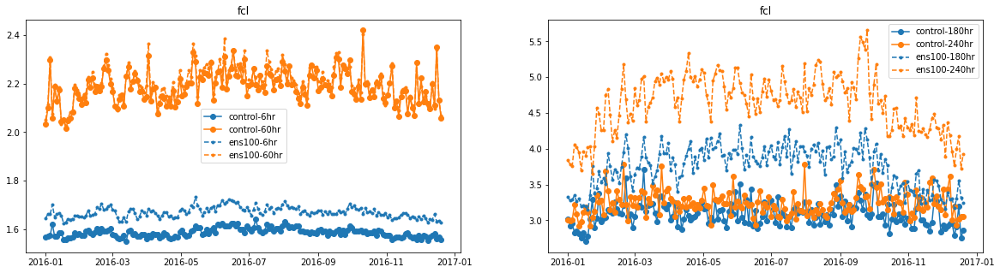

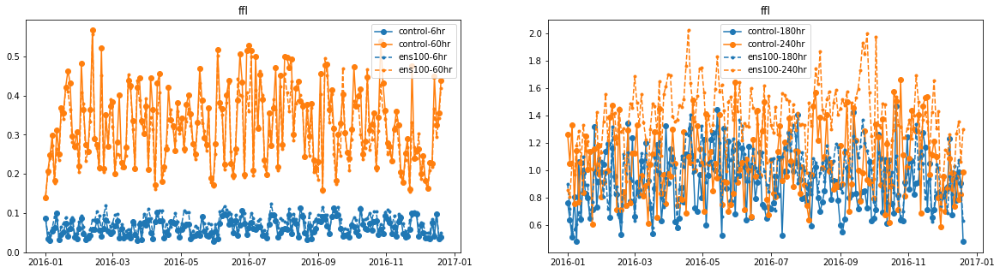

...

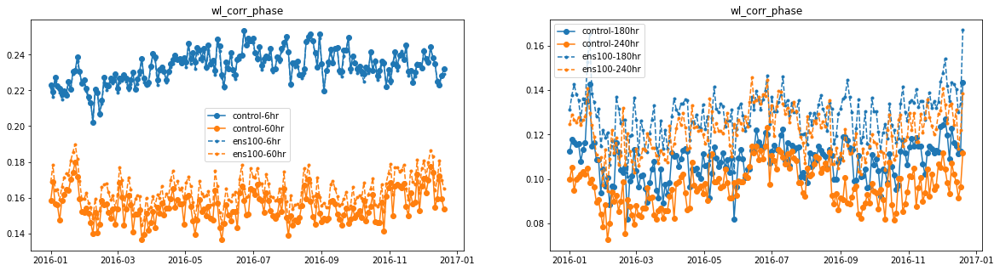

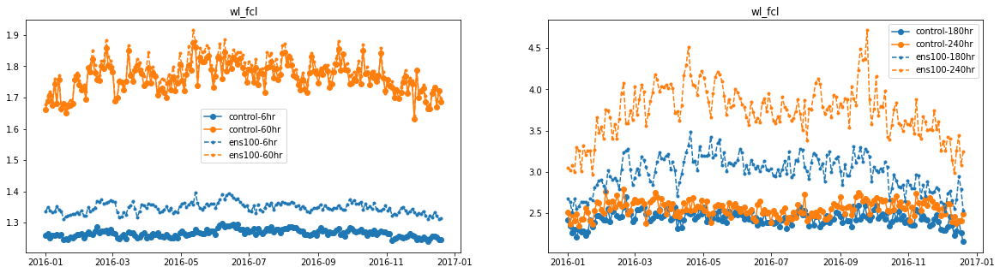

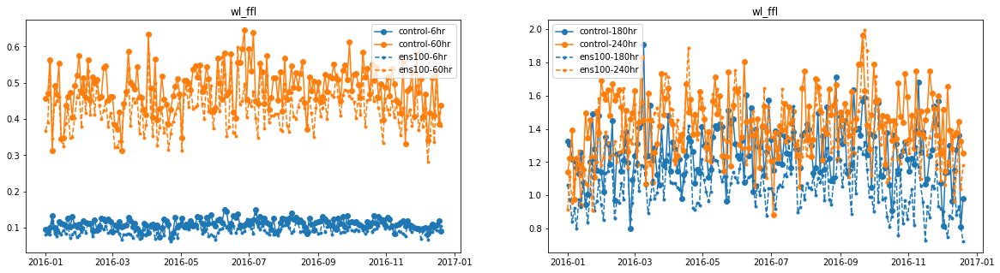

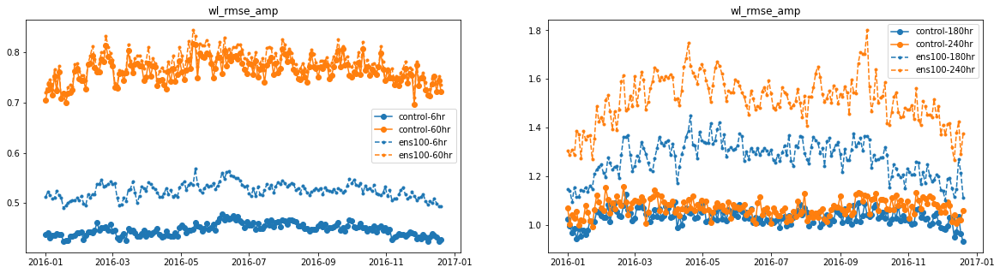

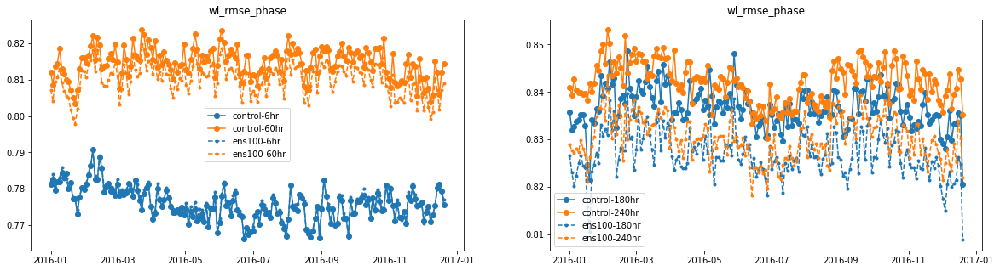

In [14]:
ts_l = [[1, 10], [30, 40]]

n_ics = control['acc'].shape[0]

ics = (np.arange(n_ics)*6*DECORRELATION_TIME).astype('timedelta64[h]') + np.datetime64('2016')

for i, key in enumerate([k for k in control.keys() if '_by_freq' not in k]):
    
    plt.figure(figsize=(20, 5))

    for i, ts in enumerate(ts_l):

        plt.subplot(1, 2, i+1)

        for (run_name, hf5) in runs:

            marker, linestyle = run_style[run_name]

            for j, t in enumerate(ts):

                label = f'{run_name}-{t*6}hr'

                seq = hf5[key][:, t, :]

                plt.plot(ics, seq, color=colors[j], marker=marker, linestyle=linestyle, label=label)

        # plt.title(f'log1p({key})')
        plt.title(key)
        plt.legend()
    plt.show()